In [1]:
cd D:\\Saarbrucken\\EDA_Research\\vae-disentanglement\\disentanglement_lib_pl

D:\Saarbrucken\EDA_Research\vae-disentanglement\disentanglement_lib_pl


In [2]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import namedtuple
from matplotlib import cm as mpl_colormaps
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

import torch
import torchvision.utils as vutils
import torchvision.transforms.functional as T
from torch.utils.data import DataLoader
from torchvision import transforms

import models
from common.data_loader import DSpritesDataset, ThreeShapesDataset, ContinumDataset
from common import utils
from common import notebook_utils as nbutils
from common.utils import CenteredNorm
from gnncsvae_experiment import GNNCSVAEExperiment
from common.ops import reparametrize

# Change figure aesthetics
%matplotlib inline
sns.set_context('talk', font_scale=1.2, rc={'lines.linewidth': 1.5})
np.set_printoptions(suppress=True,precision=4)

In [4]:
# these two will be used any time we load a saved checkppoint

PROJECT_ROOT = r"D:\Saarbrucken\EDA_Research\vae-disentanglement"
datapath = os.path.join(PROJECT_ROOT, "datasets")
os.environ['DISENTANGLEMENT_LIB_DATA'] = datapath

ModelParams = namedtuple('ModelParams', ["z_dim", "l_dim", "num_labels" , "in_channels", 
                                        "image_size", "batch_size", "w_recon", "w_kld", "w_sup_reg", "w_cov_loss", 
                                         "kl_warmup_epochs",
                                         "adjacency_matrix", "loss_terms", "use_loss_weights",
                                        "controlled_capacity_increase", "iterations_c", "max_capacity", "dset_name", 
                                         "num_indept_nodes", "prior_type"
                                        ])

ExpParams = dict(
        in_channels=3,
        image_size=64,
        LR=1e-4,
        weight_decay=0.0,       
        dataset=None,
        datapath=datapath,
        droplast=True,        
        batch_size=64,
        num_workers=0,
        pin_memory=False,
        seed=123,
        evaluation_metrics=None,
        visdom_on=False,
        save_dir=None,
        max_epochs=1,
        l_zero_reg=False
)

# Dataset = CelebA

In [6]:

# load the learned model here

algo_name = "LatentNN_CSVAE"
checkpoint_path = os.path.join(PROJECT_ROOT, "models", "celeba_wkld1_z30_350eps.ckpt")
z_dim = 1
channels = 3
l_dim = 5
num_nodes = 5
num_indept_nodes = 25
dataset_name = "celeba"
current_device = torch.device("cuda:0")
prior_type = "independent_fixed_prior"

# prep params
model_params = ModelParams(
        [z_dim], l_dim, 0, channels, 64, 64,
        1.0, 5.0, 0.0, 0, 0,
        os.path.join(PROJECT_ROOT, "adjacency_matrices", "celeba_apparel.pkl"),
        [], False,
        False, 0, 0, dataset_name, num_indept_nodes, prior_type
)

ExpParams['channels'] = channels

# load model
print("Loading model")
vae_model_class = getattr(models, algo_name)
vae_model = vae_model_class(model_params)

vae_experiment = GNNCSVAEExperiment.load_from_checkpoint(
            checkpoint_path,
            vae_model=vae_model, 
            params=ExpParams,
            dataset_params=None).to(current_device)


Loading model
Posterior mat:  tensor([[1., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0.],
        [1., 0., 1., 0., 0.],
        [1., 0., 0., 1., 0.],
        [1., 0., 0., 0., 1.]])
tensor([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.

In [7]:
print("Loading dataset: ", dataset_name)
dataset = nbutils.get_configured_dataset(dataset_name)
sample_loader = DataLoader(dataset, batch_size=64, shuffle = True, drop_last=True)

Loading dataset:  celeba


# Learned Prior, Posterior activations

In [8]:
images, labels = next(sample_loader.__iter__())

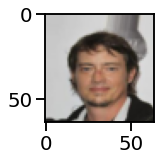

In [9]:
ref_img = images[20]
fig, ax = plt.subplots(figsize=(2,2))
ax.imshow(ref_img.permute(1,2,0), cmap='gray')
ref_img = ref_img.unsqueeze(0).to(current_device)

D:\Saarbrucken\EDA_Research\vae-disentanglement\disentanglement_lib_pl\common\notebook_utils.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(ncols=len(imgs), squeeze=False, **kwargs)


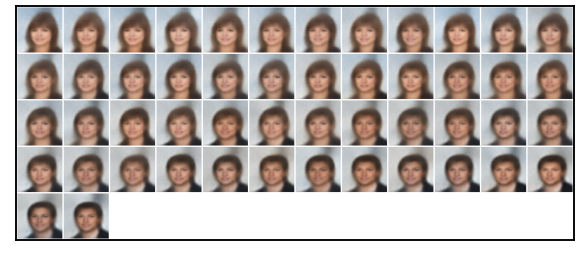

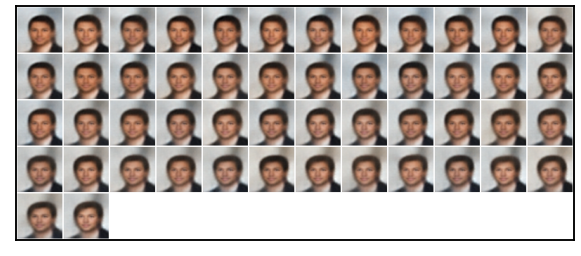

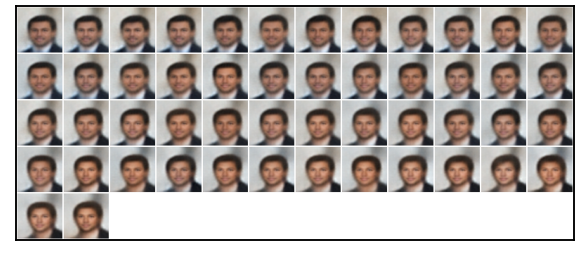

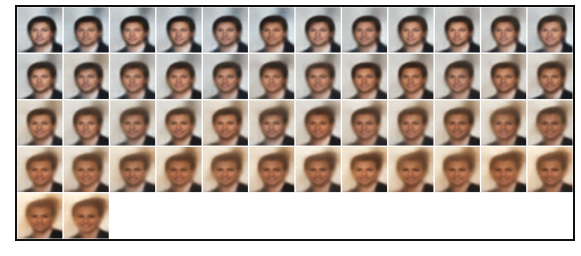

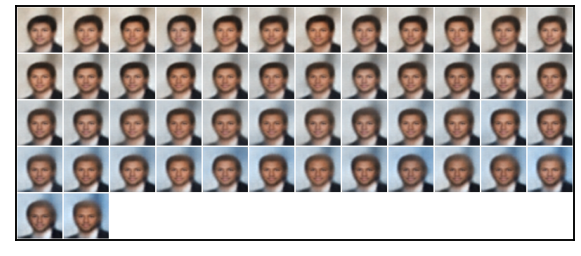

...

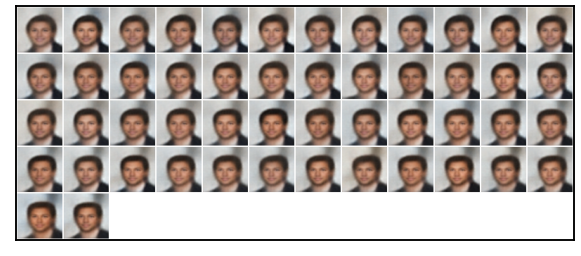

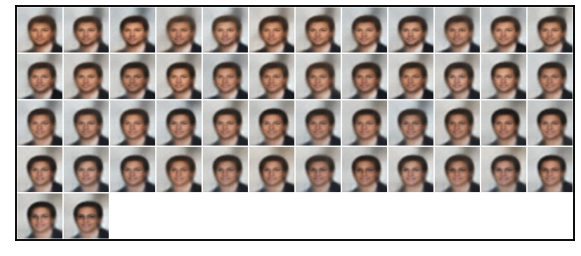

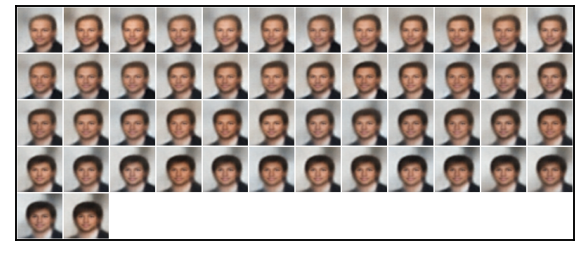

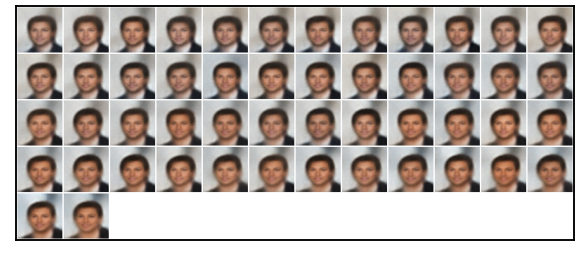

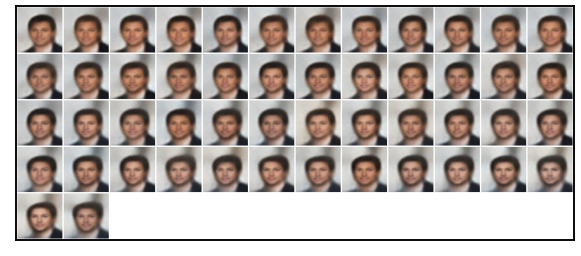

In [10]:
# hard interventions
intervention_values = torch.arange(-2.5,2.5,0.1).to(current_device)
anchor_image = ref_img

for intervened_node in range(0, vae_model.num_nodes):
    # if I do it like this, then I'm keeping the same anchor_image (so same mu) but
    # I sample a new z every time which can cause unnecessary variance in the results
    # I should try with keeping the z same through out
    nbutils.latentnn_show_intervention_atlas_from_anchor(intervened_node, intervention_values, anchor_image, vae_model)


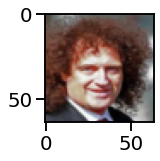

In [18]:
ref_img = images[33]
fig, ax = plt.subplots(figsize=(2,2))
ax.imshow(ref_img.permute(1,2,0), cmap='gray')
ref_img = ref_img.unsqueeze(0).to(current_device)


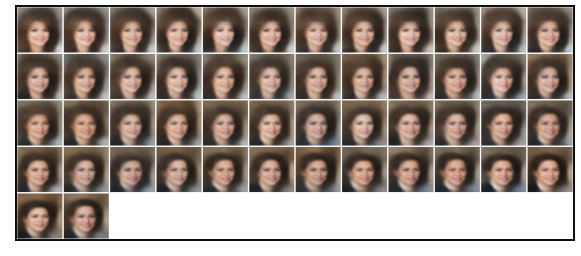

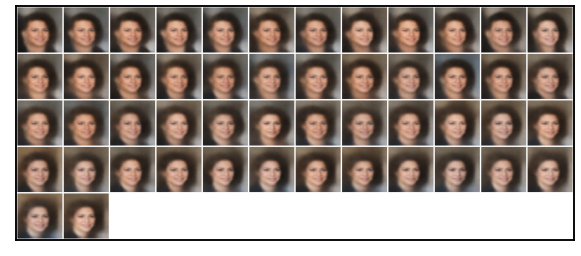

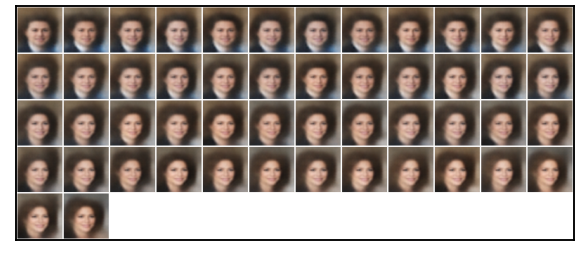

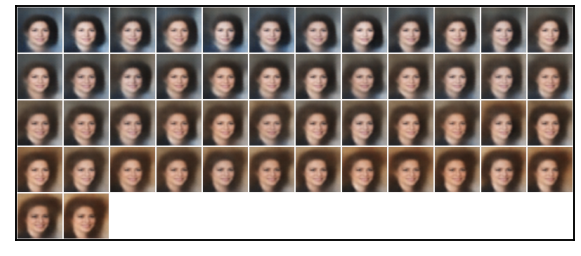

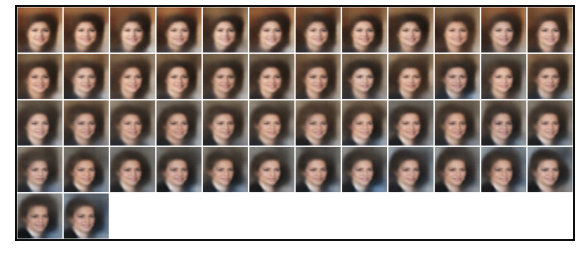

In [19]:
# hard interventions
intervention_values = torch.arange(-2.5,2.5,0.1).to(current_device)
anchor_image = ref_img

for intervened_node in range(0, 5):
    nbutils.latentnn_show_intervention_atlas_from_anchor(intervened_node, intervention_values, anchor_image, vae_model)


Observations

- node 1 : posX
- node 2 : posY
- node 3 : not sure
- node 4 : scale
- node 5 : rotation

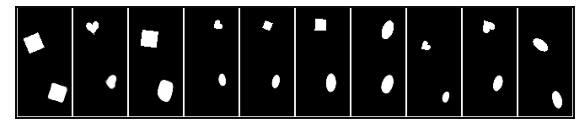

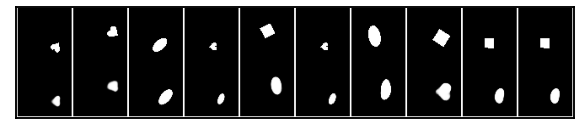

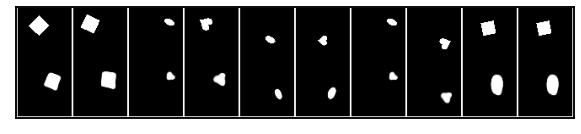

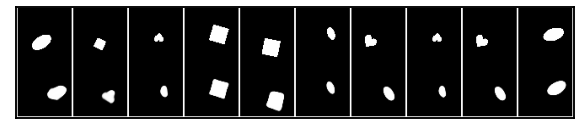

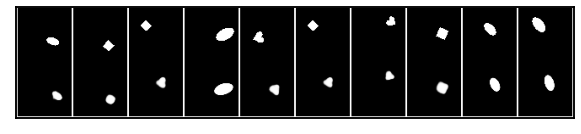

...

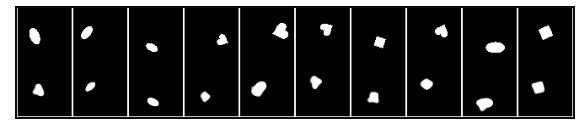

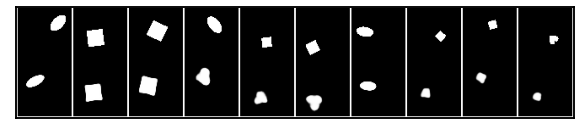

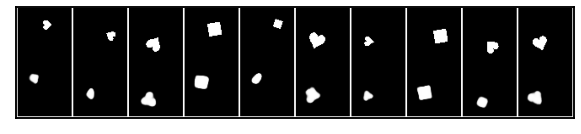

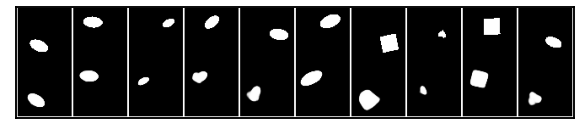

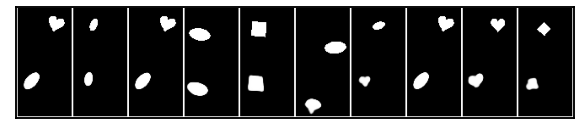

In [19]:
intervened_node = 0
num_samples = 10
# as we go down the plots, value ranges from -2 to +2
intervention_values = np.arange(-2., 2., 0.25)   

nbutils.latentnn_show_intervention_comparison(intervened_node, intervention_values, num_samples, 
                                      sample_loader, vae_model, current_device)

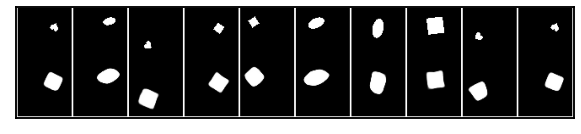

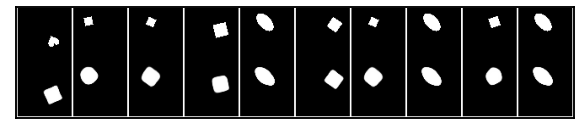

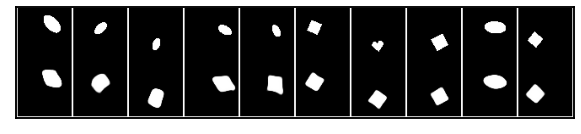

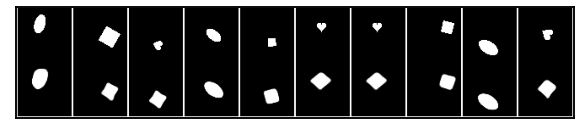

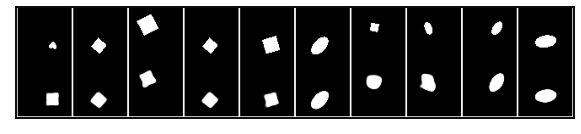

...

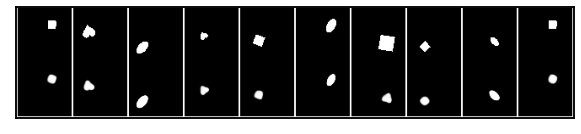

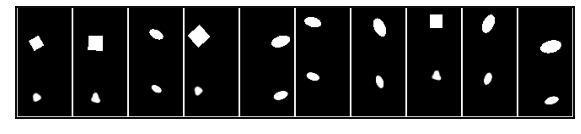

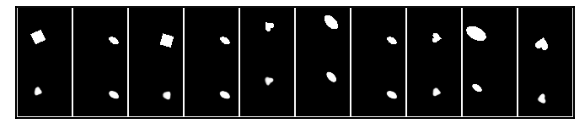

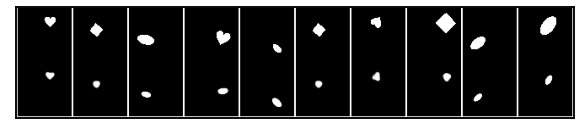

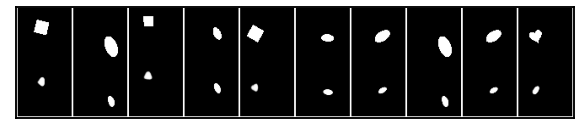

In [20]:
intervened_node = 4
num_samples = 10
# as we go down the plots, value ranges from -2 to +2
intervention_values = np.arange(-2., 2., 0.25)   

nbutils.latentnn_show_intervention_comparison(intervened_node, intervention_values, num_samples, 
                                      sample_loader, vae_model, current_device)

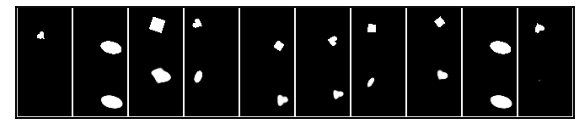

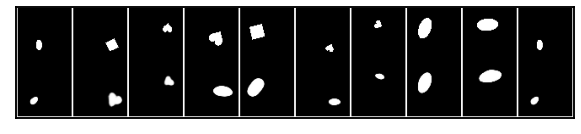

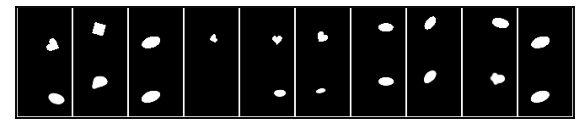

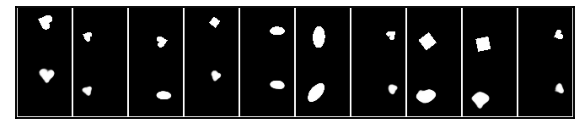

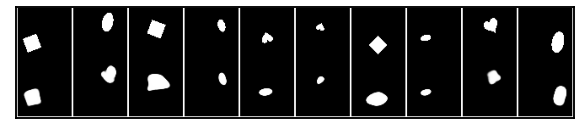

...

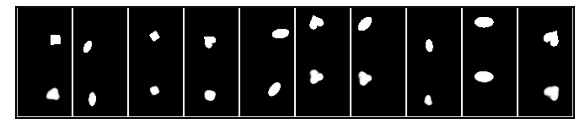

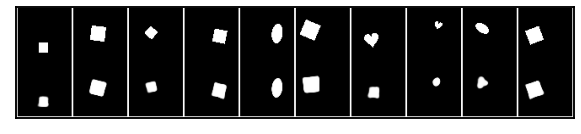

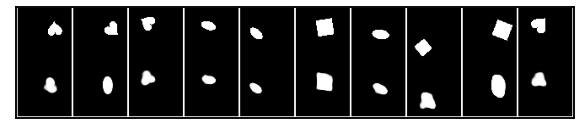

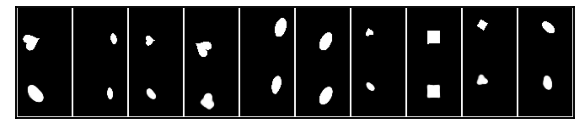

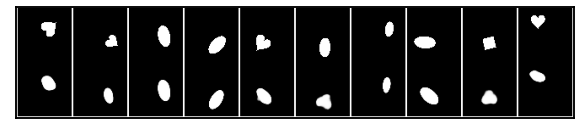

In [21]:
intervened_node = 3
num_samples = 10
# as we go down the plots, value ranges from -2 to +2
intervention_values = np.arange(-2., 2., 0.25)   

nbutils.latentnn_show_intervention_comparison(intervened_node, intervention_values, num_samples, 
                                      sample_loader, vae_model, current_device)